In [1]:
import os
os.environ['PYTHONHASHSEED'] = '0'

seed = 2016

import numpy as np
np.random.seed(seed)

import tensorflow as tf
tf.random.set_seed(seed)  

import random as rn
rn.seed(seed)


In [2]:
import os

train_x_path = "/kaggle/input/isic-2018/data/images/train"
train_y_path = "/kaggle/input/isic-2018/data/annotations/train"
val_x_path = "/kaggle/input/isic-2018/data/images/val"
val_y_path = "/kaggle/input/isic-2018/data/annotations/val"
test_x_path = "/kaggle/input/isic-2018/data/images/test"
test_y_path = "/kaggle/input/isic-2018/data/annotations/test"

# Verify
print("Train images:", len(os.listdir(train_x_path)))
print("Train masks:", len(os.listdir(train_y_path)))
print("val images:", len(os.listdir(val_x_path)))
print("val masks:", len(os.listdir(val_y_path)))
print("test images:", len(os.listdir(test_x_path)))
print("test masks:", len(os.listdir(test_y_path)))

Train images: 2596
Train masks: 2596
val images: 102
val masks: 102
test images: 1002
test masks: 1002


In [3]:
pip install -U albumentations

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 43.1/43.1 kB 1.4 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.5/66.5 kB 4.2 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 369.4/369.4 kB 12.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.1/1.1 MB 34.0 MB/s eta 0:00:00
  Attempting uninstall: albucore
    Found existing installation: albucore 0.0.19
    Uninstalling albucore-0.0.19:
      Successfully uninstalled albucore-0.0.19
  Attempting uninstall: albumentations
    Found existing installation: albumentations 1.4.20
    Uninstalling albumentations-1.4.20:
      Successfully uninstalled albumentations-1.4.20
Note: you may need to restart the kernel to use updated packages.


In [ ]:
import os
import cv2
import random
import numpy as np
import albumentations as A
from sklearn.model_selection import train_test_split

IMG_SIZE = (256, 256)
CLIP_LIMIT = 2.0  # CLAHE clip limit
GRID_SIZE = (8, 8)  # CLAHE tile grid size
ALPHA = 1.2  # Contrast adjustment factor
THETA = 10  # Brightness adjustment

# --- Preprocessing Functions ---

def contrast_enhancement(image):
    """Applies contrast enhancement."""
    lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
    l, a, b = cv2.split(lab)

    # Histogram Equalization
    l_eq = cv2.equalizeHist(l)

    # Adaptive Histogram Equalization
    clahe = cv2.createCLAHE(clipLimit=CLIP_LIMIT, tileGridSize=GRID_SIZE)
    l_ah = clahe.apply(l_eq)

    # Contrast Stretching
    l_cs = np.zeros_like(l_ah)
    cv2.normalize(l_ah, l_cs, 0, 230, cv2.NORM_MINMAX)

    # Merge and convert back to BGR
    enhanced_lab = cv2.merge((l_cs, a, b))
    enhanced_bgr = cv2.cvtColor(enhanced_lab, cv2.COLOR_LAB2BGR)

    # Adjust contrast and brightness
    final_image = cv2.convertScaleAbs(enhanced_bgr, alpha=ALPHA, beta=THETA)

    return final_image

def normalize_v_channel(img):
    """Normalizes brightness in HSV space."""
    hsv = cv2.cvtColor(img, cv2.COLOR_BGR2HSV)
    hsv[:, :, 2] = cv2.equalizeHist(hsv[:, :, 2])
    return cv2.cvtColor(hsv, cv2.COLOR_HSV2BGR)

def remove_artifacts(img):
    """Reduces noise using bilateral filtering."""
    return cv2.bilateralFilter(img, d=9, sigmaColor=75, sigmaSpace=75)

def preprocess_image(img):
    """Full preprocessing pipeline."""
    img = contrast_enhancement(img)  # Step 1: Contrast enhancement
    #img = remove_artifacts(img)      # Step 2: Noise reduction
    #img = normalize_v_channel(img)   # Step 3: Illumination normalization
    return img

# --- Augmentation Function ---

def augment_image(image, mask, num_aug=8):
    augmented_images, augmented_masks = [], []

    #image = (image * 255).astype(np.uint8)
    
    # Combine augmentations
    aug_pipeline = A.Compose([
        A.HorizontalFlip(p=0.5),
        A.VerticalFlip(p=0.5),
        A.RandomBrightnessContrast(brightness_limit=0.2, p=0.5),
        A.Rotate(limit=60, p=0.7),
        A.Affine(shear=(-15, 15), p=0.6)
    ])
    
    augmented_images.append(image)
    augmented_masks.append(mask)
    
    for _ in range(num_aug):
        augmented = aug_pipeline(image=image, mask=mask)
        augmented_images.append(augmented['image'])
        augmented_masks.append(augmented['mask'])
    
    return augmented_images, augmented_masks

# --- Data Loading Functions ---

def load_image(image_path, mask_path):
    image = cv2.imread(image_path, cv2.IMREAD_COLOR)
    image = cv2.resize(image, IMG_SIZE)
    image = contrast_enhancement(image)
    #image = image / 255.0
    mask = cv2.imread(mask_path, cv2.IMREAD_GRAYSCALE)
    mask = cv2.resize(mask, IMG_SIZE)
    mask = mask / 255.0
    mask = np.where(mask > 0.5, 1, 0).astype(np.uint8)
    mask = np.expand_dims(mask, axis=-1)
    return image, mask

def load_dataset(images_path, masks_path, augment=True, num_aug=8):
    image_filenames = sorted(os.listdir(images_path))

    images, masks = [], []
    
    for img_file in image_filenames:

        img_id = img_file.replace(".jpg", "")
        possible_masks = [
            f"{img_id}_segmentation.png",
            f"{img_id}_Segmentation.png"
        ]

        mask_path = None
        for pm in possible_masks:
            candidate = os.path.join(masks_path, pm)
            if os.path.exists(candidate):
                mask_path = candidate
                break


        if mask_path is None:
            print(f"⚠️ Warning: No matching mask for {img_file}, skipping.")
            continue

        img_path = os.path.join(images_path, img_file)
        image, mask = load_image(img_path, mask_path)  # uint8
        
        if augment:
            aug_images, aug_masks = augment_image(image, mask, num_aug)
            images.extend(aug_images)
            masks.extend(aug_masks)
        else:
            images.append(image)
            masks.append(mask)
    
    # Convert to float32 and normalize here (just before returning)
    #images = [img.astype(np.float32) / 255.0 for img in images]
    #masks = [mask.astype(np.float32) for mask in masks]
    
    return np.array(images), np.array(masks)

# Load datasets with augmentation for training
train_images, train_masks = load_dataset(train_x_path, train_y_path, augment=True, num_aug=6)
train_x, val_x, train_y, val_y = train_test_split(train_images, train_masks, test_size=0.1, random_state=42)

# Print shapes to verify correctness
print(f"✅ Aug Train Images: {train_x.shape}")
print(f"✅ Aug Train Masks: {train_y.shape}")
print(f"✅ Validation Images: {val_x.shape}")
print(f"✅ Validation Masks: {val_y.shape}")

⚠️ Warning: No matching mask for ATTRIBUTION.txt, skipping.
⚠️ Warning: No matching mask for LICENSE.txt, skipping.
✅ Aug Train Images: (16342, 256, 256, 3)
✅ Aug Train Masks: (16342, 256, 256, 1)
✅ Validation Images: (1816, 256, 256, 3)
✅ Validation Masks: (1816, 256, 256, 1)


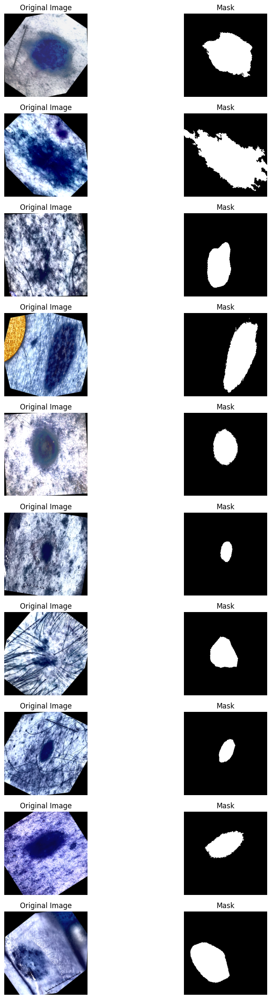

In [5]:
import matplotlib.pyplot as plt

def visualize_samples(images, masks, num_samples=5):
    """
    Displays images and corresponding masks with optional augmentation.

    Args:
        images (numpy array): Array of images.
        masks (numpy array): Array of corresponding masks.
        num_samples (int): Number of samples to display.
        augment (bool): If True, displays augmented images.
    """
    plt.figure(figsize=(10, num_samples * 3))

    for i in range(num_samples):
        img = images[i]
        mask = masks[i].squeeze() 

        plt.subplot(num_samples, 2, i * (2) + 1)
        plt.imshow(img)
        plt.axis("off")
        plt.title("Original Image")

        plt.subplot(num_samples, 2, i * (2) + 2)
        plt.imshow(mask, cmap="gray")
        plt.axis("off")
        plt.title("Mask")

        

    plt.show()

# Call function to visualize
visualize_samples(train_x, train_y, num_samples=10)


In [6]:
import gc
# Delete large variables
del train_images, train_masks
# Run garbage collection
gc.collect()

53103

In [7]:
# Import required libraries
import tensorflow as tf
from tensorflow.keras import backend as K

# Dice Coefficient
def dice_coef(y_true, y_pred, smooth=1e-6):
    y_true = tf.cast(y_true, tf.float32)  
    y_pred = tf.cast(y_pred, tf.float32)  
    y_true_f = K.flatten(y_true)
    y_pred_f = K.flatten(y_pred)
    intersection = K.sum(y_true_f * y_pred_f)
    return (2. * intersection + smooth) / (K.sum(y_true_f) + K.sum(y_pred_f) + smooth)

# Intersection over Union (IoU) Coefficient
def iou_coef(y_true, y_pred, smooth=1e-6):
    # Ensure both y_true and y_pred are float32
    y_true_f = K.cast(K.flatten(y_true), dtype="float32")
    y_pred_f = K.flatten(y_pred)  

    intersection = K.sum(y_true_f * y_pred_f)
    union = K.sum(y_true_f) + K.sum(y_pred_f) - intersection

    return (intersection + smooth) / (union + smooth)

# Sensitivity (Recall)
def sensitivity(y_true, y_pred, smooth=1e-6):
    y_true_f = K.cast(K.flatten(y_true), dtype="float32")  # Explicit cast
    y_pred_f = K.cast(K.flatten(y_pred), dtype="float32")  # Explicit cast

    true_positives = K.sum(y_true_f * y_pred_f)
    false_negatives = K.sum(y_true_f * (1 - y_pred_f))
    return (true_positives + smooth) / (true_positives + false_negatives + smooth)

# Specificity
def specificity(y_true, y_pred, smooth=1e-6):
    y_true_f = K.cast(K.flatten(y_true), dtype="float32")  # Explicit cast
    y_pred_f = K.cast(K.flatten(y_pred), dtype="float32")  # Explicit cast

    true_negatives = K.sum((1 - y_true_f) * (1 - y_pred_f))
    false_positives = K.sum((1 - y_true_f) * y_pred_f)
    return (true_negatives + smooth) / (true_negatives + false_positives + smooth)




In [8]:
import tensorflow as tf
from tensorflow.keras import backend as K

def dice_loss(y_true, y_pred):
    """Dice loss to minimize. Negative of the dice coefficient"""
    return 1.0 - dice_coef(y_true, y_pred)

def bce_dice_loss(y_true, y_pred):
    """Combined binary crossentropy and dice loss"""
    return tf.keras.losses.binary_crossentropy(y_true, y_pred) + dice_loss(y_true, y_pred)

loss_function = bce_dice_loss

In [9]:
import tensorflow as tf
from tensorflow.keras.layers import *
from tensorflow.keras.models import Model
from tensorflow.keras import backend as K

# ─────────────────────────────────────────────
# 🔹 SCSE Block
# ─────────────────────────────────────────────
def SCSE_Block(inputs, reduction_ratio=16, name=None):
    channels = inputs.shape[-1]

    se = GlobalAveragePooling2D()(inputs)
    se = Dense(channels // reduction_ratio, activation='relu', use_bias=False)(se)
    se = Dense(channels, activation='sigmoid', use_bias=False)(se)
    se = Reshape((1, 1, channels))(se)
    channel_out = Multiply()([inputs, se])

    avg_pool = Lambda(lambda x: K.mean(x, axis=-1, keepdims=True))(inputs)
    max_pool = Lambda(lambda x: K.max(x, axis=-1, keepdims=True))(inputs)
    concat = Concatenate(axis=-1)([avg_pool, max_pool])
    spatial = Conv2D(1, (7, 7), padding='same', activation='sigmoid', use_bias=False)(concat)
    spatial_out = Multiply()([inputs, spatial])

    return Add()([channel_out, spatial_out])

# ─────────────────────────────────────────────
# 🔹 Bottleneck Block
# ─────────────────────────────────────────────
def MultiScale_Block(inputs, filters=256):

    conv = Conv2D(filters, (1, 1), padding="same", activation='relu')(inputs)
    
    conv1 = Conv2D(filters, (3, 3), padding="same", dilation_rate=1, activation='relu')(inputs)
    
    conv2 = Conv2D(filters, (3, 3), padding="same", dilation_rate=2, activation='relu')(inputs)
    
    conv4 = Conv2D(filters, (3, 3), padding="same", dilation_rate=4, activation='relu')(inputs)
    conv4 = Conv2D(filters, (3, 3), padding="same", dilation_rate=2, activation='relu')(conv4)
    
    conv6 = Conv2D(filters, (3, 3), padding="same", dilation_rate=6, activation='relu')(inputs)
    conv6 = Conv2D(filters, (3, 3), padding="same", dilation_rate=4, activation='relu')(conv6)
    conv6 = Conv2D(filters, (3, 3), padding="same", dilation_rate=2, activation='relu')(conv6)

    x = Concatenate()([conv, conv1, conv2, conv4, conv6])
    x = Conv2D(filters, (1, 1), padding="same", activation='relu')(x)
    x = BatchNormalization()(x)
    return x


def Pyramid_feature_Block(input_tensor):
    """ Multi-Scale Pyramid Module """
    conv1 = Conv2D(1024, kernel_size=1, padding='same', activation='relu')(input_tensor)
    conv2 = Conv2D(256, kernel_size=1, padding='same', activation='relu')(input_tensor)
    upsampled = Conv2D(16, kernel_size=1, padding='same', activation='relu')(conv2)
    merged = Concatenate()([conv1, upsampled])
    return merged

# ─────────────────────────────────────────────
# 🔹 Conv Block
# ─────────────────────────────────────────────
def conv_block(inputs, filters):
    x = Conv2D(filters, (3, 3), activation="relu", padding="same")(inputs)
    x = BatchNormalization()(x)
    x = Conv2D(filters, (3, 3), activation="relu", padding="same")(x)
    x = BatchNormalization()(x)
    return x


# ─────────────────────────────────────────────
# 🔹 Encoder Block
# ─────────────────────────────────────────────
def encoder_block(inputs, filters, name=None):
    x = conv_block(inputs, filters)
    x = SCSE_Block(x, name=f"{name}_scse" if name else None)
    p = MaxPooling2D((2, 2))(x)
    return x, p


# ─────────────────────────────────────────────
# 🔹 Decoder Block (with Double Skip Connection)
# ─────────────────────────────────────────────
def decoder_block(inputs, skip_connection, previous_skip, filters, name=None):
    x = UpSampling2D((2, 2))(inputs)
    
    if previous_skip is not None:
        previous_skip = Conv2D(filters, (1, 1), padding='same')(previous_skip)
        previous_skip = MaxPooling2D(pool_size=(2, 2))(previous_skip)
        x = Concatenate()([x, skip_connection, previous_skip])
    else:
        x = Concatenate()([x, skip_connection])

    x = conv_block(x, filters)
    x = SCSE_Block(x, name=f"{name}_scse" if name else None)
    return x
    
# ─────────────────────────────────────────────
# 🔹 Full Model
# ─────────────────────────────────────────────
def AttMP_UNet(input_shape=(256, 256, 3), num_classes=1):
    inputs = Input(input_shape)

    # Encoder with named SCSE blocks
    c1, p1 = encoder_block(inputs, 32, name="encoder_scse_0")
    c2, p2 = encoder_block(p1, 64, name="encoder_scse_1")
    c3, p3 = encoder_block(p2, 128, name="encoder_scse_2")
    c4, p4 = encoder_block(p3, 256, name="encoder_scse_3")

    # Bottleneck with named SCSE
    bn = MultiScale_Block(p4, filters=512)
    bn = Pyramid_feature_Block(bn)
    bn = SCSE_Block(bn, name="bottleneck_scse")
    
    # Decoder with named SCSE blocks
    d1 = decoder_block(bn, c4, c3, 256, name="decoder_scse_0")
    d2 = decoder_block(d1, c3, c2, 128, name="decoder_scse_1")
    d3 = decoder_block(d2, c2, c1, 64, name="decoder_scse_2")
    d4 = decoder_block(d3, c1, None, 32, name="decoder_scse_3")

    outputs = Conv2D(num_classes, (1, 1), activation="sigmoid")(d4)

    model = Model(inputs, outputs, name="AttMP_UNet")
    return model

In [10]:
strategy = tf.distribute.MirroredStrategy(devices=["/gpu:0", "/gpu:1"])



In [11]:
with strategy.scope():
    # Build the model
    model = AttMP_UNet()

    # Compile the model with custom loss and metrics
    model.compile(
        optimizer = tf.keras.optimizers.Adam(learning_rate=1e-4, clipnorm=1.0),
        loss=loss_function,  
        metrics=["accuracy", dice_coef, iou_coef, sensitivity, specificity]
    )


# Print the model summary
model.summary()


Model: "THA_UNet"

┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━┓
┃ Layer (type)              ┃ Output Shape           ┃        Param # ┃ Connected to           ┃
┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━┩
│ input_layer (InputLayer)  │ (None, 256, 256, 3)    │              0 │ -                      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d (Conv2D)           │ (None, 256, 256, 32)   │            896 │ input_layer[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization       │ (None, 256, 256, 32)   │            128 │ conv2d[0][0]           │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_1 (Conv2D)         │ (None, 256, 256, 32)   │          9,248 │ batch_normalization[0… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ batch_normalization_1     │ (None, 256, 256, 32)   │            128 │ conv2d_1[0][0]         │
│ (BatchNormalization)      │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ global_average_pooling2d  │ (None, 32)             │              0 │ batch_normalization_1… │
│ (GlobalAveragePooling2D)  │                        │                │                        │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense (Dense)             │ (None, 2)              │             64 │ global_average_poolin… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lambda (Lambda)           │ (None, 256, 256, 1)    │              0 │ batch_normalization_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ lambda_1 (Lambda)         │ (None, 256, 256, 1)    │              0 │ batch_normalization_1… │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ dense_1 (Dense)           │ (None, 32)             │             64 │ dense[0][0]            │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ concatenate (Concatenate) │ (None, 256, 256, 2)    │              0 │ lambda[0][0],          │
│                           │                        │                │ lambda_1[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ reshape (Reshape)         │ (None, 1, 1, 32)       │              0 │ dense_1[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ conv2d_2 (Conv2D)         │ (None, 256, 256, 1)    │             98 │ concatenate[0][0]      │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ multiply (Multiply)       │ (None, 256, 256, 32)   │              0 │ batch_normalization_1… │
│                           │                        │                │ reshape[0][0]          │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ multiply_1 (Multiply)     │ (None, 256, 256, 32)   │              0 │ batch_normalization_1… │
│                           │                        │                │ conv2d_2[0][0]         │
├───────────────────────────┼────────────────────────┼────────────────┼────────────────────────┤
│ add (Add)                 │ (None, 256, 256, 32)   │              0 │ multiply[0][0],        │
│                           │                        │                │ multiply_1[0][0]       │
├──────────────────────

 Total params: 20,412,003 (77.87 MB)

 Trainable params: 20,407,139 (77.85 MB)

 Non-trainable params: 4,864 (19.00 KB)

In [12]:
from tensorflow.keras.mixed_precision import set_global_policy
set_global_policy('mixed_float16')



In [13]:
# Callbacks
from tensorflow.keras.callbacks import ModelCheckpoint, ReduceLROnPlateau, EarlyStopping, TensorBoard

model_checkpoint_path = "best_unet_model.keras"

callbacks = [
    ModelCheckpoint(model_checkpoint_path, monitor="val_iou_coef", save_best_only=True, mode="max", verbose=1),
    ReduceLROnPlateau(
        monitor='val_iou_coef',  # Reduce LR when validation loss stops improving
        factor=0.5,          # Reduce LR by 50% (0.001 → 0.0005 → 0.00025 ...)
        patience=2,          # Wait 2 epochs before reducing LR
        min_lr=1e-6,         # Do not go below 0.000001
        verbose=1,
        mode="max"
    ),
    EarlyStopping(monitor="val_iou_coef", patience=5, restore_best_weights=True, verbose=1, mode="max"),
    TensorBoard(log_dir="./logs", histogram_freq=1, write_graph=True, write_images=True)  # Added better tracking
]

# Training
history = model.fit(
    train_x, train_y,
    validation_data=(val_x, val_y),
    epochs=50,
    batch_size=16,
    callbacks=callbacks,
    verbose=1
)

# Load best model weights
model.load_weights(model_checkpoint_path)
print("✅")


Epoch 1/60
1022/1022 ━━━━━━━━━━━━━━━━━━━━ 0s 474ms/step - accuracy: 0.8990 - dice_coef: 0.6836 - iou_coef: 0.5344 - loss: 0.6084 - sensitivity: 0.8196 - specificity: 0.8553
Epoch 1: val_iou_coef improved from -inf to 0.74512, saving model to best_unet_model.keras
1022/1022 ━━━━━━━━━━━━━━━━━━━━ 550s 500ms/step - accuracy: 0.8991 - dice_coef: 0.6836 - iou_coef: 0.5344 - loss: 0.6083 - sensitivity: 0.8196 - specificity: 0.8553 - val_accuracy: 0.9519 - val_dice_coef: 0.8513 - val_iou_coef: 0.7451 - val_loss: 0.3181 - val_sensitivity: 0.8698 - val_specificity: 0.9582 - learning_rate: 1.0000e-04
Epoch 2/60
1022/1022 ━━━━━━━━━━━━━━━━━━━━ 0s 475ms/step - accuracy: 0.9464 - dice_coef: 0.8264 - iou_coef: 0.7102 - loss: 0.3294 - sensitivity: 0.8591 - specificity: 0.9526
Epoch 2: val_iou_coef improved from 0.74512 to 0.75642, saving model to best_unet_model.keras
1022/1022 ━━━━━━━━━━━━━━━━━━━━ 506s 495ms/step - accuracy: 0.9464 - dice_coef: 0.8264 - iou_coef: 0.7102 - loss: 0.3294 - sensitivity: 0

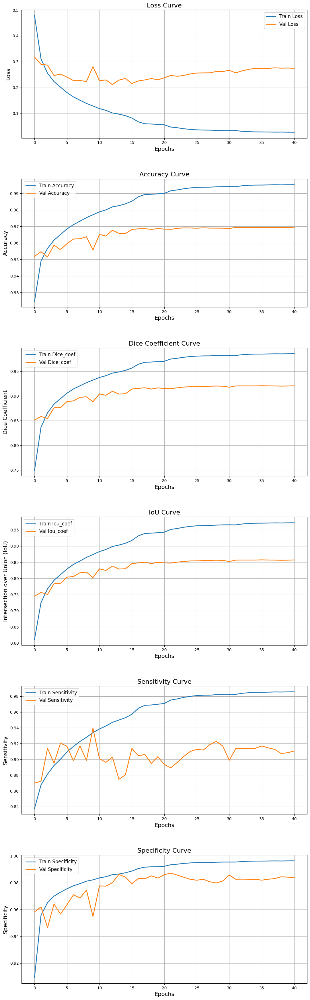

In [22]:
import matplotlib.pyplot as plt

# Extract history
epochs = range(len(history.history["loss"]))

# Define metrics and their titles
metrics = [
    ("loss", "Loss Curve", "Loss"),
    ("accuracy", "Accuracy Curve", "Accuracy"),
    ("dice_coef", "Dice Coefficient Curve", "Dice Coefficient"),
    ("iou_coef", "IoU Curve", "Intersection over Union (IoU)"),
    ("sensitivity", "Sensitivity Curve", "Sensitivity"),
    ("specificity", "Specificity Curve", "Specificity")
]

plt.figure(figsize=(12, 36))  # Large figure for better readability

for i, (metric, title, ylabel) in enumerate(metrics):
    plt.subplot(6, 1, i + 1)  # 6 rows, 1 column
    plt.plot(epochs, history.history[metric], label=f"Train {metric.capitalize()}", linewidth=2)
    plt.plot(epochs, history.history[f"val_{metric}"], label=f"Val {metric.capitalize()}", linewidth=2)
    plt.xlabel("Epochs", fontsize=14)
    plt.ylabel(ylabel, fontsize=14)
    plt.title(title, fontsize=16)
    plt.legend(fontsize=12)
    plt.grid(True)

plt.tight_layout(pad=5.0)  
plt.show()


In [14]:

test_images, test_masks = load_dataset(test_x_path, test_y_path, augment=False)

print(f"✅ Aug Train Images: {test_images.shape}")
print(f"✅ Aug Train Masks: {test_masks.shape}")

⚠️ Warning: No matching mask for ATTRIBUTION.txt, skipping.
⚠️ Warning: No matching mask for LICENSE.txt, skipping.
✅ Aug Train Images: (1000, 256, 256, 3)
✅ Aug Train Masks: (1000, 256, 256, 1)


**Test on ISIC 2018 TEST SET**

In [15]:
# Evaluate model on test set
test_results = model.evaluate(test_images, test_masks, verbose=1)
# Print evaluation results
print(f"Test Loss: {test_results[0]:.4f}")
print(f"Test Accuracy: {test_results[1]:.4f}")
print(f"Test Dice Coefficient: {test_results[2]:.4f}")
print(f"Test IoU: {test_results[3]:.4f}")
print(f"Test Sensitivity (Recall): {test_results[4]:.4f}")
print(f"Test Specificity: {test_results[5]:.4f}")


32/32 ━━━━━━━━━━━━━━━━━━━━ 13s 257ms/step - accuracy: 0.9385 - dice_coef: 0.8876 - iou_coef: 0.8023 - loss: 0.5661 - sensitivity: 0.9128 - specificity: 0.9485
Test Loss: 0.6833
Test Accuracy: 0.9277
Test Dice Coefficient: 0.8717
Test IoU: 0.7773
Test Sensitivity (Recall): 0.8895
Test Specificity: 0.9483


1/1 ━━━━━━━━━━━━━━━━━━━━ 3s 3s/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 124ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 121ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 126ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 123ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 125ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step


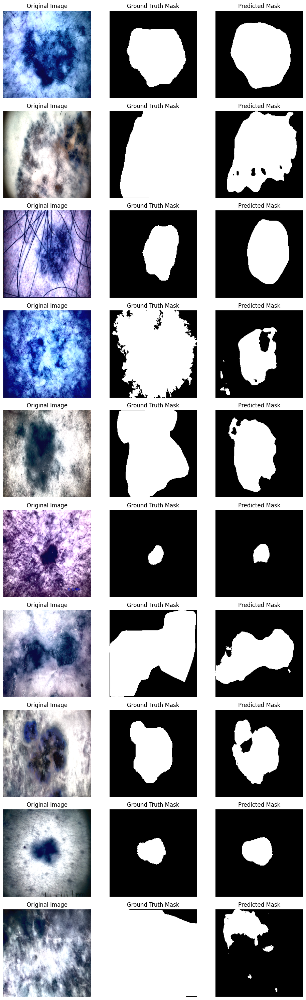

In [23]:
import numpy as np

def plot_predictions(model, test_images, test_masks, num_samples=10):
    plt.figure(figsize=(10, num_samples * 3))

    for i in range(num_samples):
        idx = np.random.randint(0, len(test_images))

        img = test_images[idx]
        true_mask = test_masks[idx]
        pred_mask = model.predict(np.expand_dims(img, axis=0))[0]

        # Convert prediction to binary (threshold = 0.5)
        pred_mask = (pred_mask > 0.5).astype(np.uint8)

        # Plot original image
        plt.subplot(num_samples, 3, i * 3 + 1)
        plt.imshow(img)
        plt.title("Original Image")
        plt.axis("off")

        # Plot true mask
        plt.subplot(num_samples, 3, i * 3 + 2)
        plt.imshow(true_mask.squeeze(), cmap="gray")
        plt.title("Ground Truth Mask")
        plt.axis("off")

        # Plot predicted mask
        plt.subplot(num_samples, 3, i * 3 + 3)
        plt.imshow(pred_mask.squeeze(), cmap="gray")
        plt.title("Predicted Mask")
        plt.axis("off")

    plt.tight_layout()
    plt.show()

# Call function to visualize results
plot_predictions(model, test_images, test_masks, num_samples=10)


**Test on ISIC 2017 TEST SET**

In [16]:
test2017_x_path = "/kaggle/input/isic-2017/ISIC_2017_DEL/ISIC-2017_Test_v2_Data/ISIC-2017_Test_v2_Data"
test2017_y_path = "/kaggle/input/isic-2017/ISIC_2017_DEL/ISIC-2017_Test_v2_Part1_GroundTruth/ISIC-2017_Test_v2_Part1_GroundTruth"

print("test images:", len(os.listdir(test2017_x_path)))
print("test masks:", len(os.listdir(test2017_y_path)))

test2017_images, test2017_masks = load_dataset(test2017_x_path, test2017_y_path, augment=False)

print(f"✅ Test Images: {test2017_images.shape}")
print(f"✅ Test Masks: {test2017_masks.shape}")


test images: 601
test masks: 600
⚠️ Warning: No matching mask for ISIC-2017_Test_v2_Data_metadata.csv, skipping.
✅ Test Images: (600, 256, 256, 3)
✅ Test Masks: (600, 256, 256, 1)


In [17]:
# Evaluate model on test set isic 2016
test_results = model.evaluate(test2017_images, test2017_masks, verbose=1)
# Print evaluation results
print(f"Test Loss: {test_results[0]:.4f}")
print(f"Test Accuracy: {test_results[1]:.4f}")
print(f"Test Dice Coefficient: {test_results[2]:.4f}")
print(f"Test IoU: {test_results[3]:.4f}")
print(f"Test Sensitivity (Recall): {test_results[4]:.4f}")
print(f"Test Specificity: {test_results[5]:.4f}")


19/19 ━━━━━━━━━━━━━━━━━━━━ 9s 502ms/step - accuracy: 0.9729 - dice_coef: 0.9369 - iou_coef: 0.8841 - loss: 0.2391 - sensitivity: 0.9102 - specificity: 0.9900
Test Loss: 0.1468
Test Accuracy: 0.9817
Test Dice Coefficient: 0.9546
Test IoU: 0.9148
Test Sensitivity (Recall): 0.9378
Test Specificity: 0.9922


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 140ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 134ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step


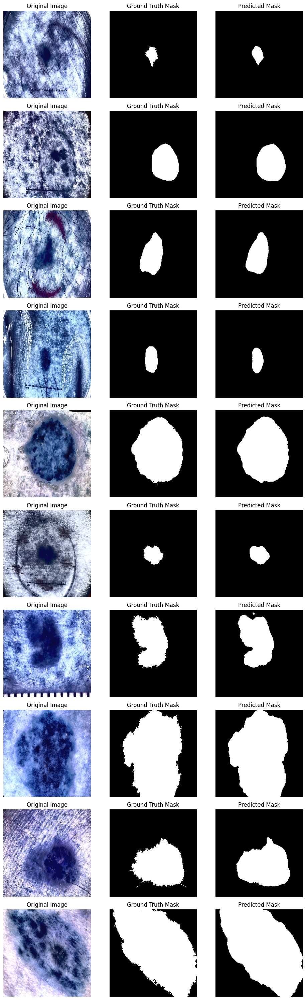

In [24]:
# Call function to visualize results
plot_predictions(model, test2017_images, test2017_masks, num_samples=10)

**Test on ISIC 2016 TEST SET**

In [18]:
test_x_path = "/kaggle/input/isic-2016-original-dataset/isic 2016/ISBI2016_ISIC_Part1_Test_Data"
test_y_path = "/kaggle/input/isic-2016-original-dataset/isic 2016/ISBI2016_ISIC_Part1_Test_GroundTruth"

print("test images:", len(os.listdir(test_x_path)))
print("test masks:", len(os.listdir(test_y_path)))


test16_images, test16_masks = load_dataset(test_x_path, test_y_path, augment=False)

print(f"✅ Test Images: {test16_images.shape}")
print(f"✅ Test Masks: {test16_masks.shape}")

test images: 379
test masks: 379
✅ Test Images: (379, 256, 256, 3)
✅ Test Masks: (379, 256, 256, 1)


In [19]:
# Evaluate model on test set
test_results = model.evaluate(test16_images, test16_masks, verbose=1)
# Print evaluation results
print(f"Test Loss: {test_results[0]:.4f}")
print(f"Test Accuracy: {test_results[1]:.4f}")
print(f"Test Dice Coefficient: {test_results[2]:.4f}")
print(f"Test IoU: {test_results[3]:.4f}")
print(f"Test Sensitivity (Recall): {test_results[4]:.4f}")
print(f"Test Specificity: {test_results[5]:.4f}")


12/12 ━━━━━━━━━━━━━━━━━━━━ 7s 637ms/step - accuracy: 0.9770 - dice_coef: 0.9578 - iou_coef: 0.9194 - loss: 0.1817 - sensitivity: 0.9649 - specificity: 0.9804
Test Loss: 0.2014
Test Accuracy: 0.9751
Test Dice Coefficient: 0.9537
Test IoU: 0.9119
Test Sensitivity (Recall): 0.9636
Test Specificity: 0.9786


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 139ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 135ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 137ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


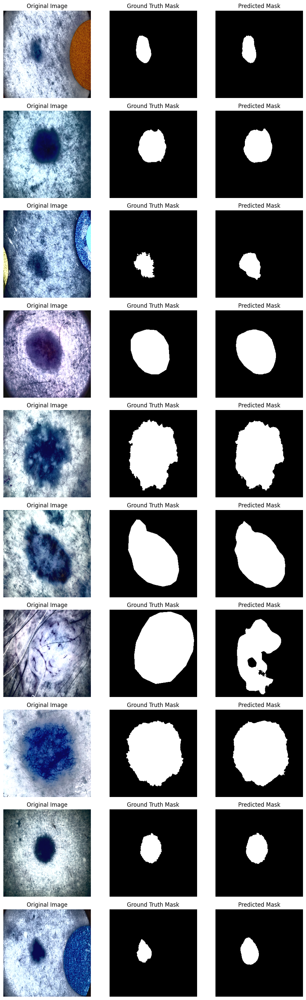

In [25]:
# Call function to visualize results
plot_predictions(model, test16_images, test16_masks, num_samples=10)


**Test on PH2 DATASET**

In [20]:
# Define PH2 dataset paths
ph2_images_path = "/kaggle/input/ph2dataset/ph2_dataset/trainx"
ph2_masks_path = "/kaggle/input/ph2dataset/ph2_dataset/trainy"

def load_ph2_dataset(images_path, masks_path, augment=True, num_aug=8):
    """Loads PH2 images and masks, ensuring correct pairing."""
    image_filenames = sorted(os.listdir(images_path))
    mask_filenames = sorted(os.listdir(masks_path))

    images, masks = [], []

    for img_file in image_filenames:
        img_id = os.path.splitext(img_file)[0]  # Get filename without extension
        mask_file = f"{img_id}_lesion.bmp"  # Corrected mask filename format

        img_path = os.path.join(images_path, img_file)
        mask_path = os.path.join(masks_path, mask_file)

        if not os.path.exists(mask_path):
            print(f"⚠️ Warning: No matching mask for {img_file}, skipping.")
            continue  # Skip images with missing masks

        image, mask = load_image(img_path, mask_path)

        if augment:
            aug_images, aug_masks = augment_image(image, mask, num_aug=num_aug)
            images.extend(aug_images)
            masks.extend(aug_masks)
        else:
            images.append(image)
            masks.append(mask)

    return np.array(images), np.array(masks)

# Load PH2 dataset
ph2_images, ph2_masks = load_ph2_dataset(ph2_images_path, ph2_masks_path, augment=False)

# Print dataset shapes to verify
print(f"✅ PH2 Images: {ph2_images.shape}")
print(f"✅ PH2 Masks: {ph2_masks.shape}")



✅ PH2 Images: (200, 256, 256, 3)
✅ PH2 Masks: (200, 256, 256, 1)


In [21]:
# Evaluate model on test set isic 2016
test_results = model.evaluate(ph2_images, ph2_masks, verbose=1)

# Print evaluation results
print(f"Test Loss: {test_results[0]:.4f}")
print(f"Test Accuracy: {test_results[1]:.4f}")
print(f"Test Dice Coefficient: {test_results[2]:.4f}")
print(f"Test IoU: {test_results[3]:.4f}")
print(f"Test Sensitivity (Recall): {test_results[4]:.4f}")
print(f"Test Specificity: {test_results[5]:.4f}")


7/7 ━━━━━━━━━━━━━━━━━━━━ 2s 240ms/step - accuracy: 0.9412 - dice_coef: 0.9004 - iou_coef: 0.8193 - loss: 0.5533 - sensitivity: 0.9465 - specificity: 0.9417
Test Loss: 0.4752
Test Accuracy: 0.9498
Test Dice Coefficient: 0.9071
Test IoU: 0.8305
Test Sensitivity (Recall): 0.9628
Test Specificity: 0.9462


1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 132ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 129ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 131ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 133ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 136ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 130ms/step


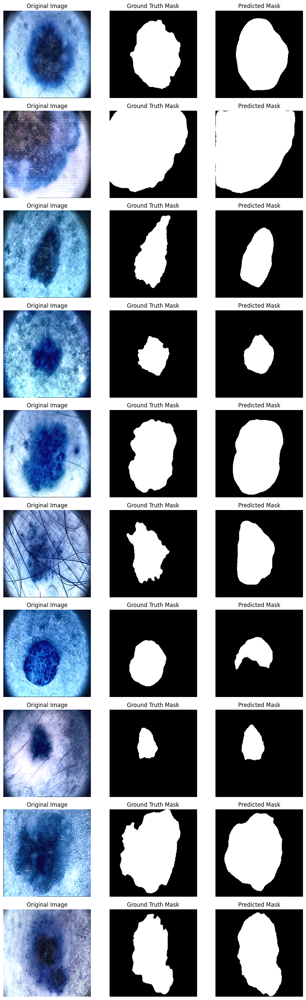

In [26]:
# Call function to visualize results
plot_predictions(model, ph2_images, ph2_masks, num_samples=10)


**ATTENTION MAP VISUALIZATION**

In [31]:
def visualize_scse_attention(model, sample_image, block_level=0):
    """
    Visualize SCSE attention for a specific encoder block level (0-3)
    """
    # These are the indices where SCSE blocks start in your model
    scse_start_indices = [6, 31, 56, 81]  # Adjust based on your actual model
    
    if block_level not in range(4):
        raise ValueError("block_level should be 0-3 (for 4 encoder blocks)")
    
    start_idx = scse_start_indices[block_level]
    scse_block = model.layers[start_idx:start_idx+16]  # Adjust range as needed
    
    # Create a model that outputs the attention components
    channel_attention_path = [
        scse_block[5],  # GlobalAveragePooling2D
        scse_block[6],  # Dense
        scse_block[9],  # Dense (sigmoid)
        scse_block[10]  # Reshape
    ]
    
    spatial_attention_path = [
        scse_block[7],  # Lambda (avg pool)
        scse_block[8],  # Lambda (max pool)
        scse_block[11], # Concatenate
        scse_block[13]  # Conv2D (spatial attention)
    ]
    
    # Create partial models
    channel_model = Model(inputs=model.input, outputs=channel_attention_path[-1].output)
    spatial_model = Model(inputs=model.input, outputs=spatial_attention_path[-1].output)
    
    # Get attention maps
    channel_att = channel_model.predict(sample_image[np.newaxis, ...])[0]
    spatial_att = spatial_model.predict(sample_image[np.newaxis, ...])[0]
    
    # Visualize
    plt.figure(figsize=(15, 5))
    
    plt.subplot(1, 3, 1)
    plt.imshow(sample_image)
    plt.title(f"Original Image (Block {block_level})")
    plt.axis('off')
    
    plt.subplot(1, 3, 2)
    plt.imshow(np.mean(channel_att, axis=-1), cmap='jet')
    plt.title("Channel Attention")
    plt.axis('off')
    
    plt.subplot(1, 3, 3)
    plt.imshow(np.mean(spatial_att, axis=-1), cmap='jet')
    plt.title("Spatial Attention")
    plt.axis('off')
    
    plt.tight_layout()
    plt.show()



1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 288ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 0s 349ms/step


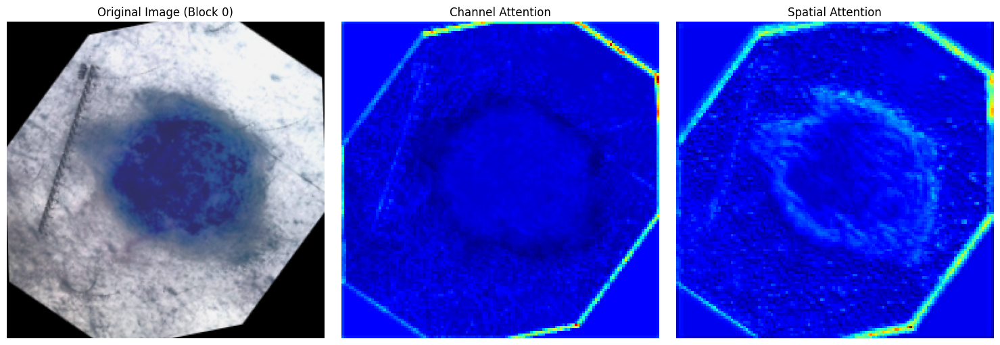

1/1 ━━━━━━━━━━━━━━━━━━━━ 1s 718ms/step
1/1 ━━━━━━━━━━━━━━━━━━━━ 2s 2s/step


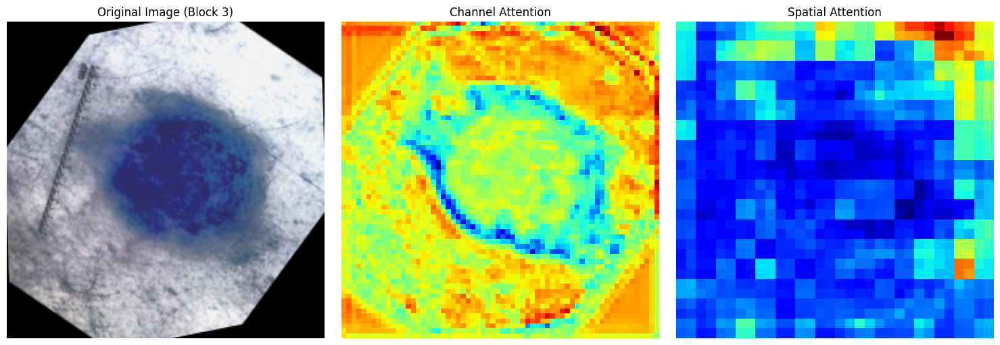

In [36]:
# Load a sample image
sample_img = train_x[0]

# Visualize SCSE attention at different levels
visualize_scse_attention(model, sample_img, block_level=0)  # First encoder block

visualize_scse_attention(model, sample_img, block_level=3)  # Last encoder block

